-------------------------- Python & library version --------------------------
Python version: 3.9.13 (tags/v3.9.13:6de2ca5, May 17 2022, 16:36:42) [MSC v.1929 64 bit (AMD64)]
pandas version: 1.5.3
numpy version: 1.23.5
matplotlib version: 3.7.2
tqdm version: 4.65.0
sktime version: 0.21.0
xgboost version: 1.7.6
seaborn version: 0.12.2
scikit-learn version: 1.2.2
------------------------------------------------------------------------------


C:\Users\wkdal\AppData\Local\Temp\ipykernel_6696\634060294.py:49: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  train['week'] = date.dt.weekofyear
100%|██████████| 204000/204000 [01:03<00:00, 3230.90it/s]


train data shape
x:(1872, 15), y:(1872,)


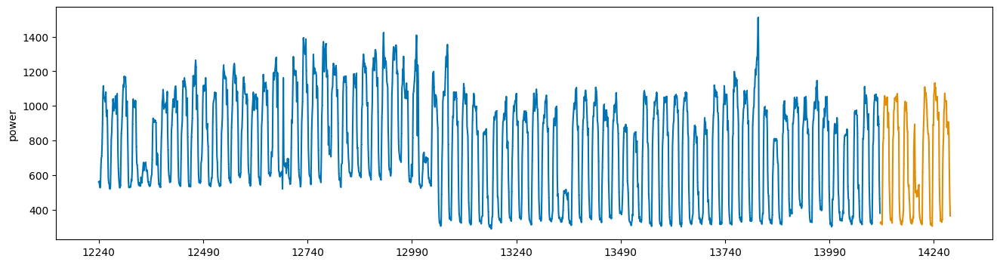

실제값이 100일 때 50으로 underestimate할 때의 SMAPE : 33.33333333333333
실제값이 100일 때 150으로 overestimate할 때의 SMAPE : 20.0


In [21]:
import sys
import sktime
import tqdm as tq
import matplotlib
import seaborn as sns
import sklearn as skl
import pandas as pd
import numpy as np
print("-------------------------- Python & library version --------------------------")
print("Python version: {}".format(sys.version))
print("pandas version: {}".format(pd.__version__))
print("numpy version: {}".format(np.__version__))
print("matplotlib version: {}".format(matplotlib.__version__))
print("tqdm version: {}".format(tq.__version__))
print("sktime version: {}".format(sktime.__version__))
print("xgboost version: {}".format(xgb.__version__))
print("seaborn version: {}".format(sns.__version__))
print("scikit-learn version: {}".format(skl.__version__))
print("------------------------------------------------------------------------------")
import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
from xgboost import XGBRegressor

pd.set_option('display.max_columns', 30)
train = pd.read_csv('./train.csv', encoding='utf-8')

## 변수들을 영문명으로 변경
# cols = ['num', 'date_time', 'power', 'temp', 'wind','hum' ,'prec', 'sun', 'non_elec', 'solar']
# train.columns = cols
train = train.rename(columns={
    '건물번호': 'num',
    '일시': 'date_time',
    '기온(C)': 'temp',
    '강수량(mm)': 'prec',
    '풍속(m/s)': 'wind',
    '습도(%)': 'hum',
    '일조(hr)': 'sun',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power'
})

# 시간 관련 변수들 생성
date = pd.to_datetime(train.date_time)
train['hour'] = date.dt.hour
train['day'] = date.dt.weekday
train['month'] = date.dt.month
train['week'] = date.dt.weekofyear

#######################################
## 건물별, 요일별, 시간별 발전량 평균 넣어주기
#######################################
power_mean = pd.pivot_table(train, values = 'power', index = ['num', 'hour', 'day'], aggfunc = np.mean).reset_index()
tqdm.pandas()
train['day_hour_mean'] = train.progress_apply(lambda x : power_mean.loc[(power_mean.num == x['num']) & (power_mean.hour == x['hour']) & (power_mean.day == x['day']) ,'power'].values[0], axis = 1)

#######################################
## 건물별 시간별 발전량 평균 넣어주기
#######################################
power_hour_mean = pd.pivot_table(train, values = 'power', index = ['num', 'hour'], aggfunc = np.mean).reset_index()
tqdm.pandas()
train['hour_mean'] = train.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.num == x['num']) & (power_hour_mean.hour == x['hour']) ,'power'].values[0], axis = 1)

#######################################
## 건물별 시간별 발전량 표준편차 넣어주기
#######################################
power_hour_std = pd.pivot_table(train, values = 'power', index = ['num', 'hour'], aggfunc = np.std).reset_index()
tqdm.pandas()
train['hour_std'] = train.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.num == x['num']) & (power_hour_std.hour == x['hour']) ,'power'].values[0], axis = 1)

### 공휴일 변수 추가
train['holiday'] = train.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
train.loc[('2022-08-15'<=train.date_time)&(train.date_time<'2022-08-16'), 'holiday'] = 1

## https://dacon.io/competitions/official/235680/codeshare/2366?page=1&dtype=recent
train['sin_time'] = np.sin(2*np.pi*train.hour/24)
train['cos_time'] = np.cos(2*np.pi*train.hour/24)

## https://dacon.io/competitions/official/235736/codeshare/2743?page=1&dtype=recent
train['THI'] = 9/5*train['temp'] - 0.55*(1-train['hum']/100)*(9/5*train['hum']-26)+32


def CDH(xs):
    ys = []
    for i in range(len(xs)):
        if i < 11:
            ys.append(np.sum(xs[:(i+1)]-26))
        else:
            ys.append(np.sum(xs[(i-11):(i+1)]-26))
    return np.array(ys)

cdhs = np.array([])
for num in range(1, 101, 1):  # Change the range from 1 to 12 (excluding 12)
    temp = train[train['num'] == num]
    cdh = CDH(temp['temp'].values)
    cdhs = np.concatenate([cdhs, cdh])
train['CDH'] = cdhs

train.drop(['num_date_time','sun','hour','solar_radiation'], axis = 1, inplace = True)
train.head()

## save the preprocessed data
train.to_csv('./train_preprocessed.csv')
## 7번 건물의 발전량
y = train.loc[train.num == 7, 'power']
x = train.loc[train.num == 7, ].iloc[:, 3:]

y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168) # 24시간*7일 = 168

print('train data shape\nx:{}, y:{}'.format(x_train.shape, y_train.shape))

plot_series(y_train, y_valid, markers=[',' , ','])
plt.show()
# Define SMAPE loss function
def SMAPE(true, pred):
    return np.mean((np.abs(true-pred))/(np.abs(true) + np.abs(pred))) * 100
print("실제값이 100일 때 50으로 underestimate할 때의 SMAPE : {}".format(SMAPE(100, 50)))
print("실제값이 100일 때 150으로 overestimate할 때의 SMAPE : {}".format(SMAPE(100, 150)))
#### alpha를 argument로 받는 함수로 실제 objective function을 wrapping하여 alpha값을 쉽게 조정할 수 있도록 작성했습니다.
# custom objective function for forcing model not to underestimate
def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

In [22]:
import pandas as pd
import numpy as np
import random
import os

from tqdm import tqdm
from autogluon.tabular import TabularDataset, TabularPredictor


# train_df = pd.read_csv('./train.csv')
# test_df = pd.read_csv('./test.csv')
sample_submission = pd.read_csv('./sample_submission.csv')
building_df = pd.read_csv('./building_info.csv')

# from datetime import datetime, timedelta

# def classify_weekdays(start_date, end_date, holidays=[]):
    date_format = "%Y-%m-%d"
    start = datetime.strptime(start_date, date_format)
    end = datetime.strptime(end_date, date_format)
    
    classification = []
    current_date = start
    
    while current_date <= end:
        if current_date.weekday() < 5:  # 0: 월요일, 1: 화요일, ..., 4: 금요일
            classification.append(0)  # 평일
        else:
            classification.append(1)  # 주말
        
        current_date += timedelta(days=1)
    
    for holiday in holidays:
        holiday_date = datetime.strptime(holiday, date_format)
        index = (holiday_date - start).days
        if 0 <= index < len(classification):
            classification[index] = 1  # 해당 날짜를 주말로 설정
    
    return classification

# # '2022-08-15'를 휴일로 추가
# holidays_to_add = ['2022-08-15']

# # 예시 데이터 프레임 생성
# data = {'date': pd.date_range(start='2022-06-01', end='2022-08-24')}
# train = pd.DataFrame(data)
# t_data = {'date': pd.date_range(start='2022-08-25', end='2022-08-31')}
# test = pd.DataFrame(t_data)

# # 주말/평일 분류한 결과를 'holidays' 열에 추가
# start_date = "2022-06-01"
# end_date = "2022-08-24"
# test_start_date = "2022-08-25"
# test_end_date = "2022-08-31"
train['holidays'] = classify_weekdays(start_date, end_date,holidays_to_add)
# train_df['holidays'] = train['holidays']
# test['holidays'] = classify_weekdays(test_start_date, test_end_date)
# test_df['holidays'] = test['holidays']
# #added
# train_df['일시'] = pd.to_datetime(train_df['일시'], format='%Y%m%d %H')
# test_df['일시'] = pd.to_datetime(test_df['일시'], format='%Y%m%d %H')

# # date time feature 생성
# train_df['hour'] = train_df['일시'].dt.hour
# train_df['day'] = train_df['일시'].dt.day
# train_df['month'] = train_df['일시'].dt.month
# train_df['year'] = train_df['일시'].dt.year

# test_df['hour'] = test_df['일시'].dt.hour
# test_df['day'] = test_df['일시'].dt.day
# test_df['month'] = test_df['일시'].dt.month
# test_df['year'] = test_df['일시'].dt.year

# train_df['sin_time'] = np.sin(2*np.pi*train_df.hour/24)
# train_df['cos_time'] = np.cos(2*np.pi*train_df.hour/24)

# test_df['sin_time'] = np.sin(2*np.pi*test_df.hour/24)
# test_df['cos_time'] = np.cos(2*np.pi*test_df.hour/24)
# train_df['THI'] = 9/5*train_df['기온(C)'] - 0.55*(1-train_df['습도(%)']/100)*(9/5*train_df['습도(%)']-26)+32
# test_df['THI'] = 9/5*test_df['기온(C)'] - 0.55*(1-test_df['습도(%)']/100)*(9/5*test_df['습도(%)']-26)+32
# ##############################################################




In [23]:
train

,num,date_time,temp,prec,wind,hum,power,day,month,week,day_hour_mean,hour_mean,hour_std,holiday,sin_time,cos_time,THI,CDH
0,1,20220601 00,18.6,NaN,0.9,42.0,1085.28,2,6,22,1774.744615,1706.318118,446.882767,0,0.000000,1.000000,49.6576,-7.4
1,1,20220601 01,18.0,NaN,1.1,45.0,1047.36,2,6,22,1687.347692,1622.620235,439.662704,0,0.258819,0.965926,47.7625,-15.4
2,1,20220601 02,17.7,NaN,1.5,45.0,974.88,2,6,22,1571.483077,1506.971294,412.071906,0,0.500000,0.866025,47.2225,-23.7
3,1,20220601 03,16.7,NaN,1.4,48.0,953.76,2,6,22,1522.153846,1437.365647,391.205981,0,0.707107,0.707107,44.7856,-33.0
4,1,20220601 04,18.4,NaN,2.8,43.0,986.40,2,6,22,1506.793846,1447.321412,381.099697,0,0.866025,0.500000,49.0061,-40.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203995,100,20220824 19,23.1,NaN,0.9,86.0,881.04,2,8,34,964.873846,1010.462118,161.399578,0,-0.965926,0.258819,63.6624,-19.6
203996,100,20220824 20,22.4,NaN,1.3,86.0,798.96,2,8,34,882.184615,928.125176,137.566008,0,-0.866025,0.500000,62.4024,-20.2
203997,100,20220824 21,21.3,NaN,1.0,92.0,825.12,2,8,34,779.095385,830.032941,128.300189,0,-0.707107,0.707107,64.1976,-22.3
203998,100,20220824 22,21.0,NaN,0.3,94.0,640.08,2,8,34,663.267692,723.100235,112.464079,0,-0.500000,0.866025,65.0744,-25.1


In [24]:
# train set과 동일한 전처리 과정
test = pd.read_csv('./test.csv', encoding='utf-8')

# cols = ['num', 'date_time', 'power', 'temp', 'wind','hum' ,'prec', 'sun', 'non_elec', 'solar']

test = test.rename(columns={
    '건물번호': 'num',
    '일시': 'date_time',
    '기온(C)': 'temp',
    '강수량(mm)': 'prec',
    '풍속(m/s)': 'wind',
    '습도(%)': 'hum',
    '일조(hr)': 'sun',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power_consumption'
})
date = pd.to_datetime(test.date_time)
test['hour'] = date.dt.hour
test['day'] = date.dt.weekday
test['month'] = date.dt.month
test['week'] = date.dt.weekofyear
test['sin_time'] = np.sin(2*np.pi*test.hour/24)
test['cos_time'] = np.cos(2*np.pi*test.hour/24)
test['holiday'] = test.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
test.loc[('2022-08-15'<=test.date_time)&(test.date_time<'2022-08-16'), 'holiday'] = 1

## 건물별 일별 시간별 발전량 평균
tqdm.pandas()
test['day_hour_mean'] = test.progress_apply(lambda x : power_mean.loc[(power_mean.num == x['num']) & (power_mean.day == x['day']) & (power_mean.hour == x['hour']) ,'power'].values[0], axis = 1)

## 건물별 시간별 발전량 평균 넣어주기
tqdm.pandas()
test['hour_mean'] = test.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.num == x['num']) & (power_hour_mean.hour == x['hour']) ,'power'].values[0], axis = 1)

tqdm.pandas()
test['hour_std'] = test.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.num == x['num']) & (power_hour_std.hour == x['hour']) ,'power'].values[0], axis = 1)

test.drop(['hour','date_time'], axis = 1, inplace = True)

# pandas 내 선형보간 method 사용
for i in range(100):
    test.iloc[i*168:(i+1)*168, :]  = test.iloc[i*168:(i+1)*168, :].interpolate()


test['THI'] = 9/5*test['temp'] - 0.55*(1-test['hum']/100)*(9/5*test['hum']-26)+32

cdhs = np.array([])
for num in range(1,101,1):
    temp = test[test['num'] == num]
    cdh = CDH(temp['temp'].values)
    cdhs = np.concatenate([cdhs, cdh])
test['CDH'] = cdhs

test = test[['num','temp', 'wind', 'hum', 'prec',  'day', 'month', 'week',
       'day_hour_mean', 'hour_mean', 'hour_std', 'holiday', 'sin_time',
       'cos_time', 'THI', 'CDH']]
test['power'] = np.nan

test.head()

C:\Users\wkdal\AppData\Local\Temp\ipykernel_6696\2614583446.py:21: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  test['week'] = date.dt.weekofyear
100%|██████████| 16800/16800 [00:05<00:00, 3271.88it/s]


,num,temp,wind,hum,prec,day,month,week,day_hour_mean,hour_mean,hour_std,holiday,sin_time,cos_time,THI,CDH,power
0,1,23.5,2.2,72,0.0,3,8,34,1627.80,1706.318118,446.882767,0,0.000000,1.000000,58.3456,-2.5,NaN
1,1,23.0,0.9,72,0.0,3,8,34,1550.08,1622.620235,439.662704,0,0.258819,0.965926,57.4456,-5.5,NaN
2,1,22.7,1.5,75,0.0,3,8,34,1431.12,1506.971294,412.071906,0,0.500000,0.866025,57.8725,-8.8,NaN
3,1,22.1,1.3,78,0.0,3,8,34,1372.20,1437.365647,391.205981,0,0.707107,0.707107,57.9376,-12.7,NaN
4,1,21.8,1.0,77,0.0,3,8,34,1381.72,1447.321412,381.099697,0,0.866025,0.500000,56.9961,-16.9,NaN


In [25]:
train.head()

,num,date_time,temp,prec,wind,hum,power,day,month,week,day_hour_mean,hour_mean,hour_std,holiday,sin_time,cos_time,THI,CDH
0,1,20220601 00,18.6,NaN,0.9,42.0,1085.28,2,6,22,1774.744615,1706.318118,446.882767,0,0.000000,1.000000,49.6576,-7.4
1,1,20220601 01,18.0,NaN,1.1,45.0,1047.36,2,6,22,1687.347692,1622.620235,439.662704,0,0.258819,0.965926,47.7625,-15.4
2,1,20220601 02,17.7,NaN,1.5,45.0,974.88,2,6,22,1571.483077,1506.971294,412.071906,0,0.500000,0.866025,47.2225,-23.7
3,1,20220601 03,16.7,NaN,1.4,48.0,953.76,2,6,22,1522.153846,1437.365647,391.205981,0,0.707107,0.707107,44.7856,-33.0
4,1,20220601 04,18.4,NaN,2.8,43.0,986.40,2,6,22,1506.793846,1447.321412,381.099697,0,0.866025,0.500000,49.0061,-40.6


In [27]:

# Rest of the code for prediction using the pre-trained model
train_df = train.drop(columns=['date_time','prec'])
test_df = test.drop(columns=['prec'])
train_data = TabularDataset(train_df)
train_data.head()

label = 'power'

####################################################

predictor = TabularPredictor(label=label, problem_type='regression').fit(
                            train_data, presets=['best_quality'],  auto_stack=True)

test_data = TabularDataset(test_df)

y_pred = predictor.predict(test_data)
x = pd.DataFrame(y_pred)

sample_submission['answer'] = x['power']
print(sample_submission)
sample_submission.to_csv('./baseline_submission.csv', index=False)

No path specified. Models will be saved in: "AutogluonModels\ag-20230814_050800\"
Presets specified: ['best_quality']
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
	Consider setting `time_limit` to ensure training finishes within an expected duration or experiment with a small portion of `train_data` to identify an ideal `presets` and `hyperparameters` configuration.
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20230814_050800\"
AutoGluon Version:  0.8.2
Python Version:     3.9.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.22000
Disk Space Avail:   27.15 GB / 511.33 GB (5.3%)
Train Data Rows:    204000
Train Data Columns: 15
Label Column: power
Preprocessing data ...


Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    3339.3 MB
	Train Data (Original)  Memory Usage: 24.48 MB (0.7% of available memory)
	Inferring data type of each feature based on column values. Set feature_metadata_in to manually specify special dtypes of the features.
	Stage 1 Generators:
		Fitting AsTypeFeatureGenerator...
			Note: Converting 1 features to boolean dtype as they only contain 2 unique values.
	Stage 2 Generators:
		Fitting FillNaFeatureGenerator...
	Stage 3 Generators:
		Fitting IdentityFeatureGenerator...
	Stage 4 Generators:
		Fitting DropUniqueFeatureGenerator...
	Stage 5 Generators:
		Fitting DropDuplicatesFeatureGenerator...
	Types of features in original data (raw dtype, special dtypes):
		('float', []) : 10 | ['temp', 'wind', 'hum', 'day_hour_mean', 'hour_mean', ...]
		('int', [])   :  5 | ['num', 'day', 'month', 'week', 'holiday']
	Types of features in processed data (raw dtype, 

         num_date_time       answer
0        1_20220825 00  1934.178711
1        1_20220825 01  1912.834473
2        1_20220825 02  1559.493652
3        1_20220825 03  1483.655029
4        1_20220825 04  1488.553223
...                ...          ...
16795  100_20220831 19   920.864685
16796  100_20220831 20   851.261841
16797  100_20220831 21   728.064087
16798  100_20220831 22   663.455200
16799  100_20220831 23   570.265320

[16800 rows x 2 columns]


C:\Users\wkdal\AppData\Local\Temp\ipykernel_6696\3026014029.py:18: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  train_to_post['week'] = date.dt.weekofyear
C:\Users\wkdal\AppData\Local\Temp\ipykernel_6696\3026014029.py:41: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  test_to_post['week'] = date.dt.weekofyear
C:\Users\wkdal\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sktime\utils\plotting.py:112: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, figsize=plt.figas

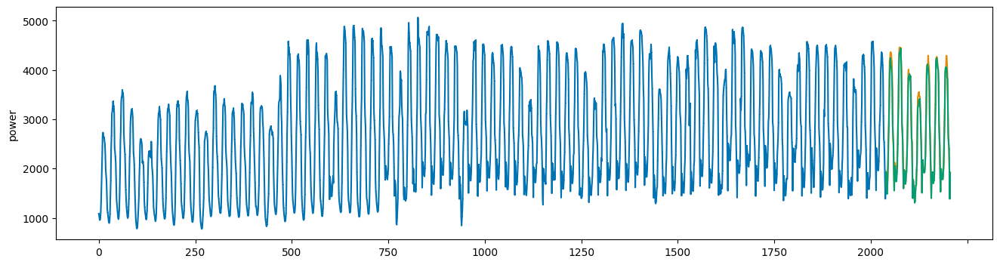

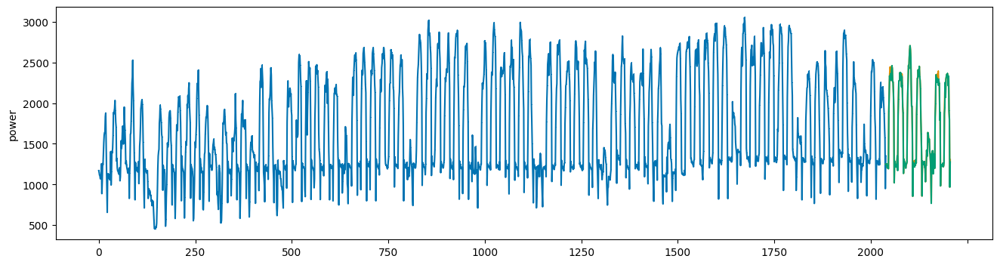

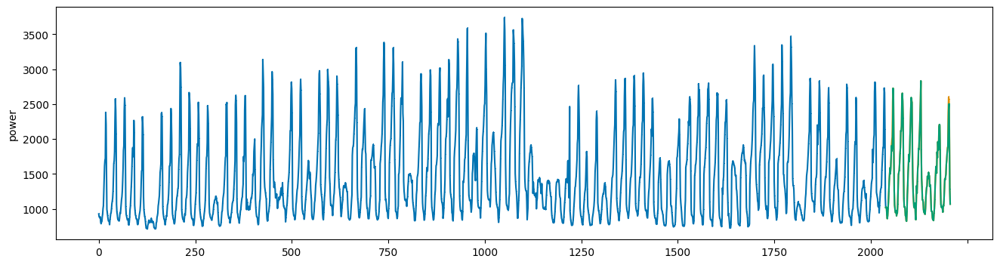

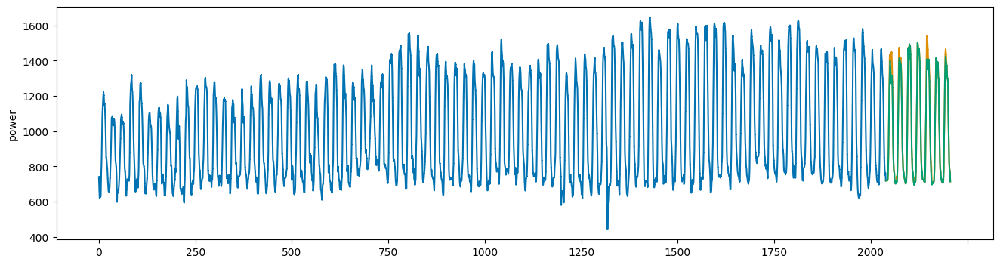

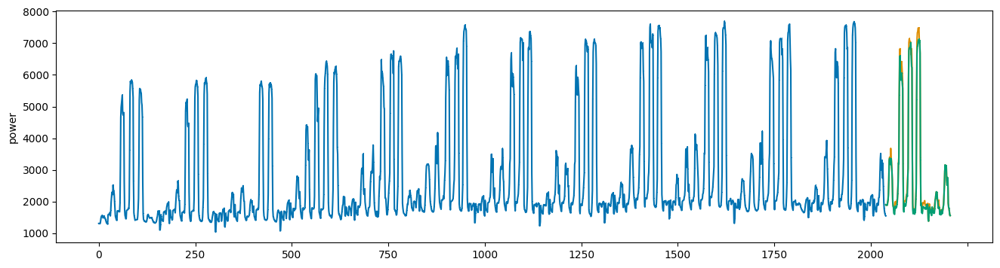

...

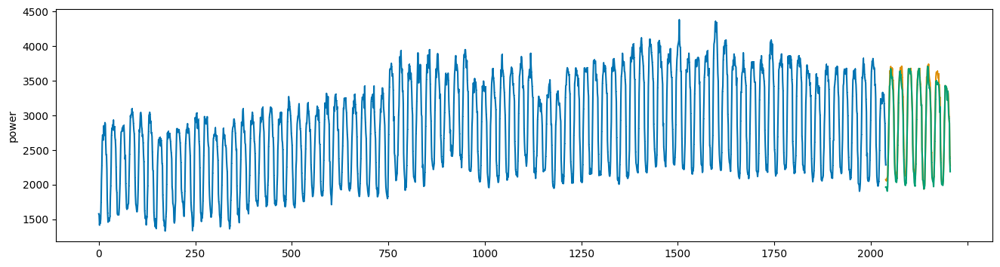

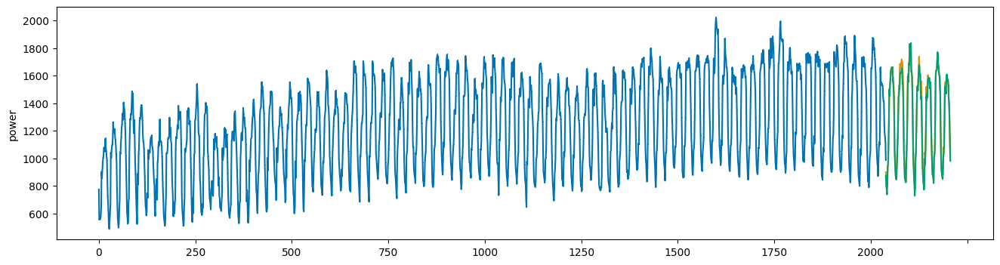

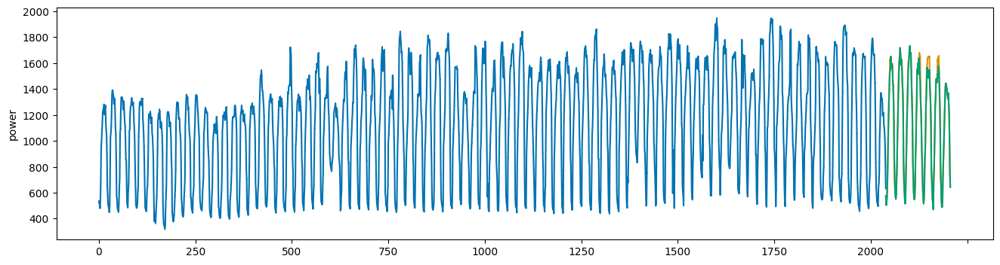

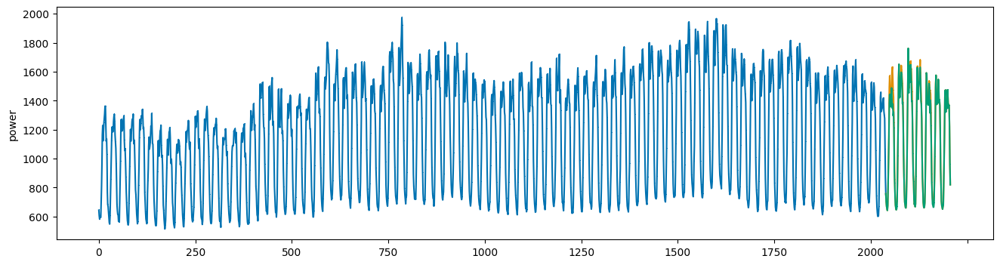

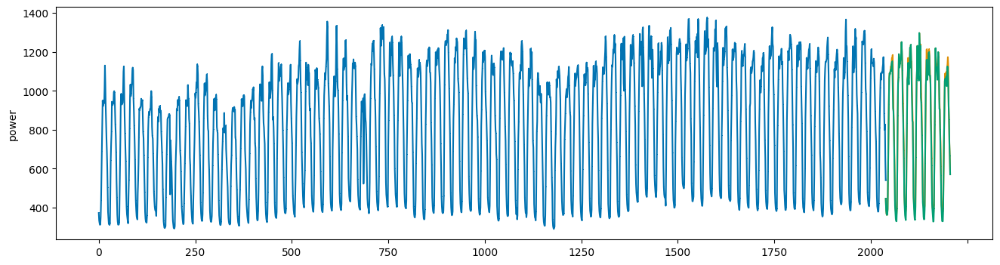

In [28]:
train_to_post = pd.read_csv('./train.csv', encoding = 'utf-8')
# cols = ['num', 'date_time', 'power', 'temp', 'wind','hum' ,'prec', 'sun', 'non_elec', 'solar']
train_to_post = train_to_post.rename(columns={
    '건물번호': 'num',
    '일시': 'date_time',
    '기온(C)': 'temp',
    '강수량(mm)': 'prec',
    '풍속(m/s)': 'wind',
    '습도(%)': 'hum',
    '일조(hr)': 'sun',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power'
})
date = pd.to_datetime(train_to_post.date_time)
train_to_post['hour'] = date.dt.hour
train_to_post['day'] = date.dt.weekday
train_to_post['month'] = date.dt.month
train_to_post['week'] = date.dt.weekofyear
train_to_post = train_to_post.loc[(('2022-08-15'>train_to_post.date_time)|(train_to_post.date_time>='2022-08-16')), ].reset_index(drop = True)

pred_clip = []
test_to_post = pd.read_csv('./test.csv',  encoding = 'utf-8')
# cols = ['num', 'date_time', 'temp', 'wind','hum' ,'prec', 'sun', 'non_elec', 'solar']
test_to_post = test_to_post.rename(columns={
    '건물번호': 'num',
    '일시': 'date_time',
    '기온(C)': 'temp',
    '강수량(mm)': 'prec',
    '풍속(m/s)': 'wind',
    '습도(%)': 'hum',
    '일조(hr)': 'sun',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power'
})

# test_to_post.columns = cols
date = pd.to_datetime(test_to_post.date_time)
test_to_post['hour'] = date.dt.hour
test_to_post['day'] = date.dt.weekday
test_to_post['month'] = date.dt.month
test_to_post['week'] = date.dt.weekofyear

## submission 불러오기
df = pd.read_csv('./baseline_submission.csv')
for i in range(100):
    min_data = train_to_post.loc[train_to_post.num == i+1, ].iloc[-28*24:, :] ## 건물별로 직전 28일의 데이터 불러오기
    ## 요일별, 시간대별 최솟값 계산
    min_data = pd.pivot_table(min_data, values = 'power', index = ['day', 'hour'], aggfunc = min).reset_index() 
    pred = df.answer[168*i:168*(i+1)].reset_index(drop=True) ## 168개 데이터, 즉 건물별 예측값 불러오기
    day =  test_to_post.day[168*i:168*(i+1)].reset_index(drop=True) ## 예측값 요일 불러오기
    hour = test_to_post.hour[168*i:168*(i+1)].reset_index(drop=True) ## 예측값 시간 불러오기
    df_pred = pd.concat([pred, day, hour], axis = 1)
    df_pred.columns = ['pred', 'day', 'hour']
    for j in range(len(df_pred)):
        min_power = min_data.loc[(min_data.day == df_pred.day[j])&(min_data.hour == df_pred.hour[j]), 'power'].values[0]
        if df_pred.pred[j] < min_power:
            pred_clip.append(min_power)
        else:
            pred_clip.append(df_pred.pred[j])

pred_origin = df.answer
pred_clip = pd.Series(pred_clip)

for i in range(100):
    power = train_to_post.loc[train_to_post.num == i+1, 'power'].reset_index(drop=True)
    preds = pred_clip[i*168:(i+1)*168]
    preds_origin = pred_origin[i*168:(i+1)*168]
    preds.index = range(power.index[-1], power.index[-1]+168)
    preds_origin.index = range(power.index[-1], power.index[-1]+168)
    
    plot_series(power, preds,  preds_origin, markers = [',', ',', ','])

submission = pd.read_csv('./sample_submission.csv')
submission['answer'] = pred_clip
submission.to_csv('./submission_amazon_final.csv', index = False)